# Coursework Three

This coursework is a complete project that you need to undertake by yourself. The dataset for this project is the same credit card dataset of Coursework one of Finance and AI module. This dataset is originally from the following reference:

I.-C. Yeh and C.-h. Lien, The comparisons of data mining techniques for the predictive accuracy of probability
of default of credit card clients, *Expert Systems with Applications*, vol. 36, no. 2, pp. 2473–2480, 2009.

In this dataset, for each account, there are two types of features one static such as "EDUCATION" that does not vary over time (or at least we make that assumption), and one time series type like "PAY_AMT2, PAY_AMT2,...." that changes as  time passes. Since the period of observation in this dataset is from April to September, 2005, we assume that the features LIMIT_BAL, SEX, EDUCATION, MARRIAGE, and AGE do not change aver this period of time.

We have built several predictive models in which this time series aspect of features is ignored, for instance, logistic, random forest, neural network, svm, etc. In this project, you must build a predictive model to forecast default where your model must take into account the time series aspect of features; i.e. your model must differentiate between and take as input two types of features, one static and one time series. 

Your report should be structured in this Jupyter notebook as follows:

1) Abstract 

2) Introduction and Preliminaries 

3) Data Exploration 

4) The Purposed Model 

5) Experiments 

6) Conclusions

In order to get the credit, you need to show your full work with detailed investigations and analysis. You can support your analysis with diagrams, formulas, figures, tables, etc. Basically, you are free in building the model as you want and filling out the content; however, your model must be legit, and you need to clearly point out how your model take into account the time series aspect of these features.  

The total number of words for the entire report must not exceed 4500 where programming codes and possible formulas are not considered as words.

As a bench mark, use random forest where you need to tune the hyperparameters as much as possible.



In [1]:
import numpy as np 
import pandas as pd 
import seaborn as sns
import matplotlib.pyplot as plt
import altair as alt
from sklearn.ensemble import RandomForestClassifier
from sklearn.model_selection import train_test_split, GridSearchCV, KFold
from sklearn.metrics import auc, roc_auc_score, roc_curve
from sklearn.preprocessing import StandardScaler
from tensorflow import keras
from keras_self_attention import SeqSelfAttention
from tcn import TCN

alt.data_transformers.disable_max_rows() 


# plot tools from altair
def plot_uni_lines(df, title = ''):
    figure = alt.Chart(df.reset_index()).transform_fold(
        df.columns.tolist(),
        as_ = ['name', 'value']
    ).mark_line(tooltip=alt.TooltipContent('encoding')).encode(
        x = 'Date:T',
        y = 'value:Q',
        color = 'name:N',
    ).facet(
        facet='name:N',
        columns=3
    ).resolve_scale(
        x='independent', 
        y='independent'
    ).properties(
        title= title
    )
    return(figure)


In [2]:
# (1) data
#Load CSV from URL using NumPy and perform some pre-processing
np.random.seed(3)
url = "https://raw.githubusercontent.com/meauxt/credit-card-default/master/credit_cards_dataset.csv"
names = ['ID', 'LIMIT_BAL', 'SEX', 'EDUCATION', 'MARRIAGE', 'AGE', 'PAY_0',
       'PAY_2', 'PAY_3', 'PAY_4', 'PAY_5', 'PAY_6', 'BILL_AMT1', 'BILL_AMT2',
       'BILL_AMT3', 'BILL_AMT4', 'BILL_AMT5', 'BILL_AMT6', 'PAY_AMT1',
       'PAY_AMT2', 'PAY_AMT3', 'PAY_AMT4', 'PAY_AMT5', 'PAY_AMT6',
       'Default']
df = pd.read_csv(url, names=names)
df = df.drop(['ID'], axis=1)
names = names[1: np.size(names, 0)]
print(df.shape)
# Convert to numeric
for column in df:
    df[column] = pd.to_numeric(df[column], errors='coerce')
df = df.dropna()

#checking NaN values if there is any then data will be sanitized 
for column in df:
    if df[column].isnull().values.any():
        print("NaN value/s detected in " + column)
    else:
        print("{} no null values".format(column))
        
# rescale sex (sex : male = 0 , female = 1)
df['SEX'][df['SEX']==1] = 0
df['SEX'][df['SEX']==2] = 1

# rescale marital status (married = 0, single = 1) after dropping 'others'
todrop0 = df[df['MARRIAGE']==3].index
df['MARRIAGE'][df['MARRIAGE']==1] = 0
df['MARRIAGE'][df['MARRIAGE']==2] = 1
df.drop(todrop0 , inplace=True)

# remove unkonown from education
todrop1 = df[df['EDUCATION'] == 5].index
todrop2 = df[df['EDUCATION'] == 6].index
df.drop(todrop1 , inplace = True)
df.drop(todrop2 , inplace = True)
data_df = df.copy()
data_df.rename({"PAY_0":"PAY_1"},axis=1,inplace=True)
var_ts_list = [_ for _ in data_df.columns if ('PAY' in _) or ('BILL' in _) ] # time series variables list 
var_con_list = [_ for _ in data_df.columns if ('PAY' not in _) and ('BILL' not in _) ] # non time-vary variables list 
data_df.head()

(30001, 24)
LIMIT_BAL no null values
SEX no null values
EDUCATION no null values
MARRIAGE no null values
AGE no null values
PAY_0 no null values
PAY_2 no null values
PAY_3 no null values
PAY_4 no null values
PAY_5 no null values
PAY_6 no null values
BILL_AMT1 no null values
BILL_AMT2 no null values
BILL_AMT3 no null values
BILL_AMT4 no null values
BILL_AMT5 no null values
BILL_AMT6 no null values
PAY_AMT1 no null values
PAY_AMT2 no null values
PAY_AMT3 no null values
PAY_AMT4 no null values
PAY_AMT5 no null values
PAY_AMT6 no null values
Default no null values


,LIMIT_BAL,SEX,EDUCATION,MARRIAGE,AGE,PAY_1,PAY_2,PAY_3,PAY_4,PAY_5,...,BILL_AMT4,BILL_AMT5,BILL_AMT6,PAY_AMT1,PAY_AMT2,PAY_AMT3,PAY_AMT4,PAY_AMT5,PAY_AMT6,Default
1,20000.0,1.0,2.0,0.0,24.0,2.0,2.0,-1.0,-1.0,-2.0,...,0.0,0.0,0.0,0.0,689.0,0.0,0.0,0.0,0.0,1.0
2,120000.0,1.0,2.0,1.0,26.0,-1.0,2.0,0.0,0.0,0.0,...,3272.0,3455.0,3261.0,0.0,1000.0,1000.0,1000.0,0.0,2000.0,1.0
3,90000.0,1.0,2.0,1.0,34.0,0.0,0.0,0.0,0.0,0.0,...,14331.0,14948.0,15549.0,1518.0,1500.0,1000.0,1000.0,1000.0,5000.0,0.0
4,50000.0,1.0,2.0,0.0,37.0,0.0,0.0,0.0,0.0,0.0,...,28314.0,28959.0,29547.0,2000.0,2019.0,1200.0,1100.0,1069.0,1000.0,0.0
5,50000.0,0.0,2.0,0.0,57.0,-1.0,0.0,-1.0,0.0,0.0,...,20940.0,19146.0,19131.0,2000.0,36681.0,10000.0,9000.0,689.0,679.0,0.0


# Abstract 

Predicting credit card default rates has become an important research topic. Traditional time-series and econometric models have challenges in predicting credit card default rates because the relevant datasets are high-dimensional and are a mixture of time-series and constant data. However, neural networks and machine learning would be ideal solutions for predicting credit card default rates. In this work, we build two predictive models based on a dataset of default payments on credit cards of customers in Taiwan. One is a random forest model and the other is a neural network model with TCN layers and attention layers. We use AUC to evaluate both models and find that they achieve similarly good performance. We believe that both models can capture the relationship between features, and both models are robust to noise and redundant information. 

# Introduction

Predicting the credit card default rate has become an important research topic. On the one hand, as an unsecured lending instrument, the credit card suffers from default risk. And the default risk may lead to a large amount of loss for banks. On the other hand, the use of credit cards generates a large amount of user data, which makes it possible to use user data to predict credit card default rates. Therefore, using credit card data to predict default risk has become one of the focuses of banks.

There are challenges in predicting credit card default rates due to the user data characteristics: 1. The data has a large dimension; 2. It contains both time series data and non-time series data; 3. The sample is large. These characteristics may pose challenges to traditional statistical methods such as econometrics and time series analysis models because traditional statistical models may not be good at analyzing big data or capturing the hidden relationships within the features.

However, neural networks would be an ideal solution for predicting the credit card default rate. Neural networks have lots of advantages, for example, they can explore the relationship between input features. Besides, they can analyze high-dimension data efficiently and may have good robustness to noise and outliers. Therefore, they are suitable for complex machine learning problems. 

In addition, machine learning models, such as random forests, will also be ideal tools for predicting default rates. With good predictive ability, they are also good at analyzing big data and recognizing the hidden patterns with the input features. Moreover, compared with neural networks, they are often more efficient in computation. Thus, when facing a specific case, it is always valuable to discuss the question: "Does a neural network really need in this case"?

So, in this study, we used a machine learning model and a neural network model to predict the credit card default rate perspectively. And then, we compared the two models' performance and discussed their advantages and disadvantages. Lastly, we explained which model is more suitable for our case and why. 

We discuss terminology in Section 2 (Preliminaries), data exploration in Section 3 (Data Exploration),  the model we used in Section 4 (The Purposed Model), the experimental results and analysis in Section 5 (Experiments), conclusions and the potential further work in Section 6 (Conclusions).

# Preliminaries

##### (1) ROC
An ROC curve (receiver operating characteristic curve) is a graph showing the performance of a classification model. This curve can be expressed mathematically as 
$$  \text{ROC: } \{(FPR_i,TPR_i)\}_1^k $$
, where 
$$ \text{TPR (True Positive Rate)} = \frac{TP}{ TP + FN}$$
$$ \text{FPR (False Positive Rate)} = \frac{FP}{ FP + TN} $$

- TP (True Positive): TP represents the number of correctly classified instances which are Positive.
- TN (True Negative): TN represents the number of correctly classified instances which are Negative.
- FP (False Positive): FP represents the number of misclassified instances which are Positive. FP is also known as a Type I error.
- FN (False Negative): FN represents the number of misclassified instances which are Negative. FN is also known as a Type II error.

##### (2) AUC
AUC（Area Under Curve）is the area under the ROC curve. AUC is the measure of the ability of a classifier to distinguish between classes and is used as a summary of the ROC curve.


##### (3) FNN
FNN (Feedforward neural network) is also called multilayer perceptrons(MLPs). It is a fully connected class of feedforward artificial neural networks (ANN). The universal approximation theorem (Hornik et al., 1989;Cybenko, 1989) tells us for any function $f(x)$, there is an FNN that can approximately approach the result and do the same job as $f(x)$. Therefore, we can use FNN to automatically do feature extraction, feature selection, and learn the non-linear patterns in the input features.



# Data Exploration 

##### （1）The Dataset Information:

The Dataset is from the case of customers' credit card default payments in Taiwan (Yeh, I. C., & Lien, C. H., 2009), including users' personal background and payment history. In our study, we aim to classify is an individual will default or not on their credit card payments. And the dataset is available on the UCI website.  

The independent variable consists of two parts: non-time series features and time-series features.

Non-time-series features include:

- Amount of the given credit (LIMIT_BAL):
- Gender (SEX): 0=male; 1=female
- EDUCATION: 1=Graduate; 2=University; 3=High School; 4=Other
- MARRIAGE: 1=Married; 2=Single; 3=Other
- Age (AGE)

Time series features include:
- Payment history from September to April in 2005 (PAY_1 - PAY_6): PAY_1 is the payment history in September, and Pay_6 is the payment history in April. 
- Bill amounts from September to April in 2005 (BILL_AMT1 - BILL_AMT6)
- Payment amounts from September to April in 2005 (PAY_AMT1 - PAY_AMT6)

The dependent variable is:

- Default label (Default): 1 = default; 0 = non-default

The dataset contains a total of 30,001 instances with 23 independent variables and 1 dependent variable. After removing the instances which contain missing data, there are 29,351 instances, including 6526 default instances and 22825 non-default instances. It means the dataset in unbalanced.

In the experiment part, we randomly split the training set, validation set, and test set according to the ratio of 6:2:2.


In [3]:
# Data Description
print("The data description is shown as follows:")
print(f"The dataset shape: {data_df.shape}")
print(f"The number of default instance: {sum(data_df['Default'] == 1)}")
print(f"The number of non-default instance: { sum(data_df['Default'] == 0)}")
data_df.describe().T

The data description is shown as follows:
The dataset shape: (29351, 24)
The number of default instance: 6526
The number of non-default instance: 22825


,count,mean,std,min,25%,50%,75%,max
LIMIT_BAL,29351.0,168270.031004,129978.839521,10000.0,50000.0,140000.0,240000.0,1000000.0
SEX,29351.0,0.603489,0.489181,0.0,0.0,1.0,1.0,1.0
EDUCATION,29351.0,1.812306,0.711334,0.0,1.0,2.0,2.0,4.0
MARRIAGE,29351.0,0.538857,0.498496,0.0,0.0,1.0,1.0,1.0
AGE,29351.0,35.390174,9.176913,21.0,28.0,34.0,41.0,79.0
PAY_1,29351.0,-0.017410,1.126090,-2.0,-1.0,0.0,0.0,8.0
PAY_2,29351.0,-0.133215,1.200839,-2.0,-1.0,0.0,0.0,8.0
PAY_3,29351.0,-0.165923,1.200595,-2.0,-1.0,0.0,0.0,8.0
PAY_4,29351.0,-0.221015,1.172474,-2.0,-1.0,0.0,0.0,8.0
PAY_5,29351.0,-0.265953,1.137168,-2.0,-1.0,0.0,0.0,8.0


##### (2) Clean Data

Before implementing the experiment, we firstly clean the data by the following process:

(1) Remove instances containing unknown information (The unknown information may be caused by errors in filling in the information), such as EDUCATION =5

(2) Remove instances containing missing values

(3) Standardized data

##### (3) Exploratory Data Analysis

Before implementing the experiment, we utilize visualization to explore the patterns in the data. The exploratory analysis can guide us design our purposed model. Specifically, the process and results of the exploratory analysis are as follows:

(1) We plot the distribution of each feature (Figure 1 and Figure 2) in the original dataset 

- According to the distribution of the dependable variable (Default), we find our dataset is unbalanced. Thus, we need to use the AUC metric to evaluate the performance of models. 

(2) We plot the bar chart (Figure 3: How the mean value of each feature varies between the default group and the non-default group)

- We plot Figure 3 to have a glance at the predictive ability of each feature. We can see there are huge differences among each feature's mean value between the two groups, which means each feature can provide useful information for the prediting the default rate. 

(3) We plot the heatmap chart (Figure 4: The two-dimension distribution of the time-series feature: PAY)

- According to the heatmap, the relationship within the time-series data can significantly contribute to predicting the default rate. As shown in Figure 4, the two-dimension distribution of the default group is completely different from that of the non-default group. This shows that the relationship within the PAY time series data can provide useful information for classification. Besides, we can see that there are lots of similarities in the distributions of the two groups, which means lots of interaction components could be noise. Therefore, when designing the purposed model, our model should: 1. have the ability to capture the relationship whithin the time-series data; 2 have enough robustness to the noise.

In [15]:
# Figure 1: The Distribution of the Time-series Feature
df = data_df[var_ts_list].copy()

figure = alt.Chart(df).transform_fold(
        df.columns.tolist(),
        as_ = ['name','value']
    ).mark_bar(
        opacity = 0.5,
        binSpacing = 0,
        tooltip = alt.TooltipContent("encoding")
    ).encode(
        alt.X('value:Q'),
        alt.Y('count()',stack=None),
        alt.Color('name:N')
    ).facet(
        facet='name:N',
        columns=3
    ).resolve_scale(
        x='independent',
        y='independent'
    ).properties(
        title='Figure 1: The Distribution of the Time-series Feature'
    )

figure

alt.FacetChart(...)

In [18]:
# Figure 2: The Distribution of the constant Feature and the dependent feature
df = data_df[var_con_list].copy()

figure = alt.Chart(df).transform_fold(
        df.columns.tolist(),
        as_ = ['name','value']
    ).mark_bar(
        opacity = 0.5,
        binSpacing = 0,
        tooltip = alt.TooltipContent("encoding")
    ).encode(
        alt.X('value:Q'),
        alt.Y('count()',stack=None),
        alt.Color('name:N')
    ).facet(
        facet='name:N',
        columns=3
    ).resolve_scale(
        x='independent',
        y='independent'
    ).properties(
        title='Figure 2: The Distribution of the Constant Feature and the Dependent Feature'
    )

figure

alt.FacetChart(...)

<AxesSubplot:title={'center':'Figure 3: How the mean value of each feature varies between the default group and the non-default group'}>

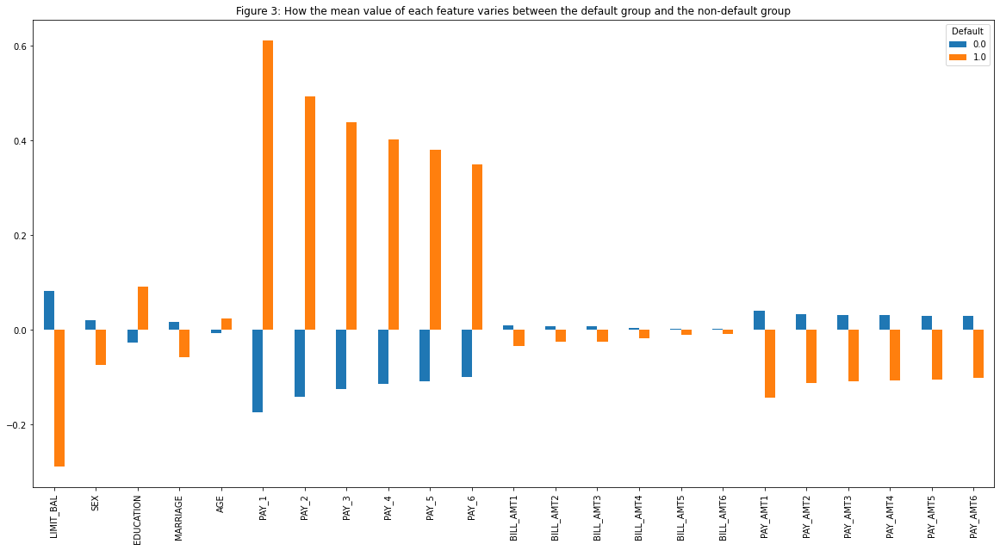

In [23]:
# Figure 3: How the mean value of each feature varies between the default group and the non-default group

df = pd.DataFrame( StandardScaler().fit_transform(data_df), columns= data_df.columns ).copy()
df['Default'] = data_df['Default'].values

df.groupby(['Default']).mean().T.plot.bar(figsize=(20,10), title='Figure 3: How the mean value of each feature varies between the default group and the non-default group')

Figure 4: The two-dimension distribution of the time-series feature (the dataset is standardized): PAY


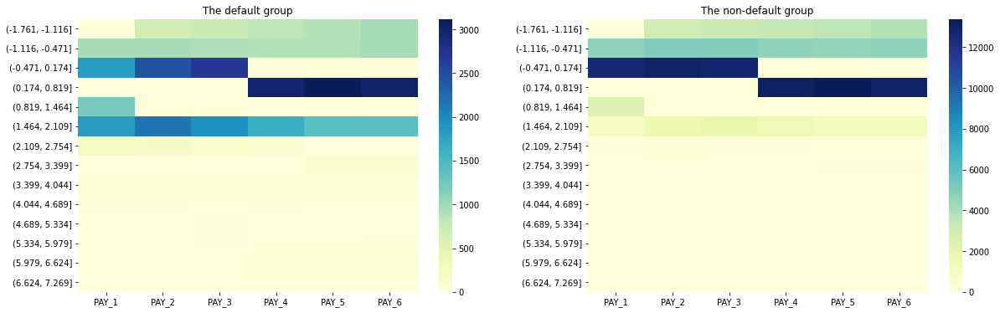

In [28]:
# Figure 4: The two-dimension distribution of the time-series feature: PAY

s='PAY'
num_bins = 15
df = data_df[[f"{s}_{i}" for i in range(1,7)]].copy()
df = pd.DataFrame( StandardScaler().fit_transform(df), columns= df.columns )
bins = np.linspace(df.min().min(), df.max().max(), num_bins)
df['Default'] = data_df['Default'].values 

print('Figure 4: The two-dimension distribution of the time-series feature (the dataset is standardized): PAY')
fig = plt.figure(figsize = (20, 6))
ax1 = fig.add_subplot(121)  
df_1 = df[[f"{s}_{i}" for i in range(1,7)]][df['Default']==1]
df_count = df_1.apply(lambda x: pd.cut(x, bins=bins))
df_count = df_count.apply(lambda x: x.value_counts())
sns.heatmap(df_count, cmap="YlGnBu")
plt.title('The default group')

ax2 = fig.add_subplot(122)  
df_0 = df[[f"{s}_{i}" for i in range(1,7)]][df['Default']==0]
df_count = df_0.apply(lambda x: pd.cut(x, bins=bins))
df_count = df_count.apply(lambda x: x.value_counts())
sns.heatmap(df_count, cmap="YlGnBu")
plt.title('The non-default group')
plt.show()

# The Purposed Model 

As we discussed in the previous part, the purposed model should has the ability to capture the relationship within features, especailly within the time-series features. Besides, the purposed model should have robustness to noise. So, we will design a neural network model which contains TCN layer and self-attention layer as the purposed model. 

In theory, the TCN can use convolutional layers to complete feature extraction and use dilated convolution layers to capture the relathionship and within the input information and recognise the hidden patterns in the interaction components. But the noise may increase when the TCN produces interaction components (or new features) via feature extraction.
So, we use the self-attention layer to help our model to focus on important interaction components and information, thus enhancing our model robustness to noise. 

The introduction of attention and TCN are as follows:


##### （1）Temporal Convolutional Networks (TCN)
TCN refers to a class of network structures which apllying convolutions in time-series analysis. In our model, the TCN structure we use is:

TCN = 1D Fully Convolutional Network (FCN) + causal convolutions. 

FCN can extract features and combination features. And the causal convolutions is a kind of multiple-layer convolution of temporal data, which ables models learn information form time-series data and ensures that the model does not violate the order in the time-series data.

Compared with RNN or LSTM, the TCN have more powerful potential to reveal hidden pattern from the time-series data and capture relationships within the features due to the FCN and causal convolutions. As for our TCN model, is could be regards as a combination of convolution and RNN.


##### （2）Self-Attention
Self-Attention is an attention mechanism relating different positions of a single sequence in order to compute a representation of the sequence. In other words, self-attention mimics the human attention mechanism, allowing the model to focus on learning important information and ignore unimportant information. More specifically, the self-attention can be expressed mathmatically as follows:

For input dataset $X \in R^{n \times m}$, where $n$ is the number of samples and $m$ is the dataset dimension.

The self-attention mechanism will create three weight matrices $W^Q$, $W^K$, $W^V$ according to the input samples, and then generate three new matrices $Q$ (query), $K$(key ), $V$(value), where

$$ Q = X W^Q, \text{   where   } W^Q \in \R^{m \times m_q} $$
$$ K = X W^K, \text{   where   } W^K \in \R^{m \times m_k}  $$
$$ V = X W^V, \text{   where   } W^V \in \R^{m \times m_v}  $$

Acturally, the names of "query", "key" and “value” come from the recommendation system. The basic idea is: given a query, calculate the correlation between the query and the key, and then find the most appropriate value according to the correlation between the query and the key. One case is movie recommendations. The query is a person's preference information for movies (such as point of interest, age, gender, etc.), the key is the type of the movie (comedy, era, etc.), and the value is the movie to be recommended. In this case, although each attribute of query, key and value is in a different space, they actually have a certain potential relationship, that is to say, through some transformation and calcalting the correlation between the key and the query, we can find out the appropriate value (movie recommended).

Next, the self-attention mechanism will use $Q$ and $K$ to calculate the similarity and standardize the scale:
$$Similarity = \text{softmax}(\frac{QK^T}{\sqrt{m_v}})$$

Finally, the similarity will be use as weights for calulating the Attention:
$$\text{Attention}(Q,K,V) = softmax(\frac{QK^T}{\sqrt{m_v}})V$$

As we can see, in conclusion, the essence of the self-Attention function can be described as a mapping from a query to a series of (key-value-value) pairs.

Self-Attention can do feature extraction and help our model focus on important information. So, the self-Attention can improve the performance of the model and the robustness to noise.


##### （3）Random Forest (the benchmark model)

We choose Random Forest as the benchmark model. Because Random Forest can capture the relationship features. Besides, Random Forest can handle unbalanced datasets.

However, Random Forest still has drawbacks. It may be affected by noise and then be easy to overfit on classification. And time-series data often contain a lot of noise. Therefore, in theory, the Random Forest model can achieve good performance, but there is still room for improvement.

If our purpose model can identify hidden patterns and relationships within the input features, and have a robustness to noise. Then it will likely outperform Random Forest in performance.



##### （4）The purposed model (the TCN-Attention neural network model)

The model divides the features into two parts: time series features and non-time series features. Learn from the idea of encoding and decoding in transformer, which enalable models to learn information from context or relationships whitin features. Our purposed model will implement the encoding of the two parts of features separately, and then combine the two parts of the encoded content togher. At last, the model will decode the encoded content and get the prediction of the probability of default.

For time-series features, we firstly use the TCN layer to extract features to capture the relathions within features, and then use the self-attention layer to let model can pay more attention to important information and be less disturbed by noise. And then, we will use a Feedforward neural network to achieve the combination of features. Now, the model can get the enconded content of time-series features.

For non-time series features, the model will use a feedforward neural network to splite and combine the information to finish encoding.

Then the model uses the Concatenate layer in Keras to stitch the two parts of the data together. Next, the model implements decoding with a self-attention layer. This allows the model to capture the relationships between time-series features and constant features. At last, through a feedforward neural network which contains a single output neuron with softmax activation function in the output layer. The model can finally predict the default probability.

Besides, in order to overcome the overfitting problem, we will use the elu activation function in the midden layers. And we will add some dropout layers(which can randomly drop some information) in our model. 

More specifically, the model structure is shown in Figure 5. 

The summary of the purposed model
Model: "model"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 Time-series features (InputLay  [(None, 18)]        0           []                               
 er)                                                                                              
                                                                                                  
 reshape (Reshape)              (None, 6, 3)         0           ['Time-series features[0][0]']   
                                                                                                  
 tcn (TCN)                      (None, 6, 12)        5052        ['reshape[0][0]']                
                                                                                                  
 dropout (Dropout)              (None, 6, 12)        0      

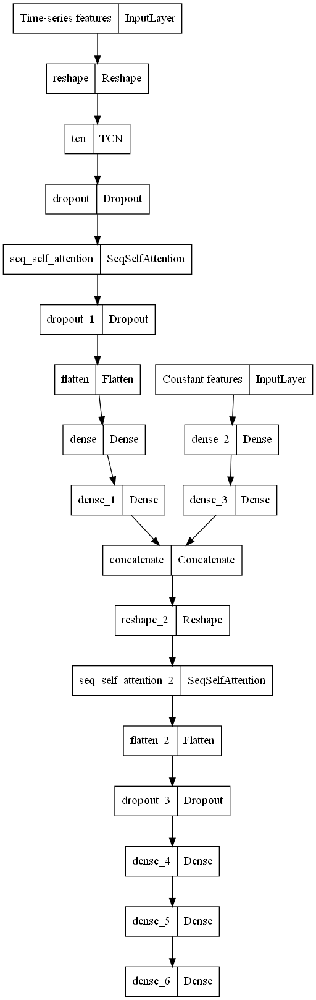

In [4]:

# -----------(branch 1)-----------
branch_1_input = keras.layers.Input(shape=(6*3,), name='Time-series features') # ts
branch_1 = keras.layers.Reshape(target_shape=(6, 3), input_shape=(6*3,))(branch_1_input)
# TCN
#branch_1 = TCN(12,input_shape=(6,3),activation='elu',  return_sequences=True)(branch_1)
branch_1 = keras.layers.Dropout(0.1)(branch_1)
branch_1 = keras.layers.SimpleRNN(128,input_shape=(6,3),activation='relu', kernel_regularizer= keras.regularizers.L2(0.01), return_sequences=True)(branch_1)
branch_1 = SeqSelfAttention(attention_activation='elu')(branch_1)
branch_1 = keras.layers.Dropout(0.2)(branch_1)

# feedforward neural network
branch_1 = keras.layers.Flatten()(branch_1)
branch_1 = keras.layers.Dense(8, activation='elu')(br aanch_1)
branch_1 = keras.layers.Dense(4, activation='elu')(branch_1)


# -----------(branch 2)-----------
branch_2_input = keras.layers.Input(shape=(5,), name='Constant features') #
branch_2 = keras.layers.Reshape(target_shape=(5, 1), input_shape=(5*1,))(branch_2_input)
branch_2 = SeqSelfAttention(12,attention_activation='elu')(branch_2)
branch_2 = keras.layers.Dropout(0.2)(branch_2)
branch_2 = keras.layers.Flatten()(branch_2)
branch_2 = keras.layers.Dense(8, activation='elu')(branch_2_input)
branch_2 = keras.layers.Dense(4, activation='elu')(branch_2)


#branch_2 = keras.layers.MaxPooling2D(pool_size=(2,2), strides=(1,1), padding='same')(branch_2)

# ------------( main branch)-------------
main_branch = keras.layers.Concatenate(axis=1)([branch_1, branch_2])
# feedforward neural netwook

main_branch = keras.layers.Reshape(target_shape=(8, 1), input_shape=(8*1,))(main_branch)
main_branch = SeqSelfAttention(12,attention_activation='elu')(main_branch)
main_branch = keras.layers.Flatten()(main_branch)
main_branch = keras.layers.Dropout(0.2)(main_branch)
main_branch = keras.layers.Dense(8, activation='elu')(main_branch)
main_branch = keras.layers.Dense(4, activation='elu')(main_branch)
# output layer 
main_branch = keras.layers.Dense(1, activation='sigmoid')(main_branch)


model = keras.models.Model(inputs=[branch_1_input, branch_2_input],outputs=[main_branch])


print("The summary of the purposed model")
model.summary()

print()
print()
print("Figure 5: The structure of the purposed model")
keras.utils.plot_model(model)

## Experiments 

##### （1）Build and evaluate the benchmark model (Random Forest):
- We randomly split the training dataset, validation dataset, and test dataset according to the ratio of 6:2:2.

- We use the K-FOLD (5-FOLD) and grid search method to tune the hyperparameters of the Random Forest model. 

- We use the AUC metric to evaluate the model because we are dealing with a binary classification task on an unbalanced dataset, 

- The model and its performance are shown as follows:


In [30]:
# split dataset ( train:cv:test = 0.6, 0.2, 0.2)

df = pd.DataFrame( StandardScaler().fit_transform(data_df), columns= data_df.columns )
df['Default'] = data_df['Default'].values

index_train_series, index_test_series = train_test_split(df.index, test_size=0.4)
index_cv_series, index_test_series  = train_test_split(index_test_series, test_size=0.5)

df_train = df.loc[index_train_series]
df_cv = df.loc[index_cv_series]
df_test = df.loc[index_test_series]

x_train = df_train[ [ i for i in df.columns if i not in ['Default'] ] ]
x_test = df_test[ [ i for i in df.columns if i not in ['Default'] ] ]
x_cv = df_cv[ [ i for i in df.columns if i not in ['Default'] ] ]

y_train = df_train[['Default']]
y_test = df_test[ ['Default'] ]
y_cv = df_cv[ ['Default'] ]

print("The shape of the train dataset, validation dataset (cv), and test dataset:")
pd.DataFrame({
    "x": [x_train.shape, x_cv.shape, x_test.shape],
    'y': [y_train.shape, y_cv.shape, y_test.shape],
}, index=['train', 'cv', 'test'])


The shape of the train dataset, validation dataset (cv), and test dataset:


,x,y
train,"(17610, 23)","(17610, 1)"
cv,"(5870, 23)","(5870, 1)"
test,"(5871, 23)","(5871, 1)"


In [49]:
import warnings
from sklearn.exceptions import DataConversionWarning
warnings.filterwarnings(action='ignore', category=DataConversionWarning)

#RandomForestClassifier 
clf = RandomForestClassifier(n_estimators=100, max_depth=9,ccp_alpha=0, random_state=0) #0.77 

# train model
clf.fit(x_train, y_train)

# Cross validation
# clf = RandomForestClassifier()
# parameters = {"max_depth":[5,7,9,11],"ccp_alpha":[0,0.5,1]}
# clf_grid = GridSearchCV(clf, parameters, cv=KFold(n_splits=5, shuffle=True), scoring = "roc_auc")
# clf_grid.fit(
#     X = pd.concat([x_train,x_cv]).values,
#     y = pd.concat([y_train,y_cv]).values
# )
# clf = clf_grid.best_estimator_
# print(clf_grid.best_estimator_)

# evaluate model
metric_roc_auc = roc_auc_score( y_test, clf.predict_proba(x_test)[:,1] )
fpr, tpr, thresholds = roc_curve(y_test, clf.predict(x_test))
metric_auc = auc(fpr, tpr)

print(f'''RandomForest -- \n1. the performance on the test dataset --  AUC : {metric_roc_auc}''')
clf.get_params

print("2. the hypoparameter of the model --")
pd.DataFrame({'hypoparameters': clf.get_params().keys(), 
              'values': clf.get_params().values() })


RandomForest -- 
1. the performance on the test dataset --  AUC : 0.787648520398978
2. the hypoparameter of the model --


,hypoparameters,values
0,bootstrap,True
1,ccp_alpha,0
2,class_weight,None
3,criterion,gini
4,max_depth,9
5,max_features,auto
6,max_leaf_nodes,None
7,max_samples,None
8,min_impurity_decrease,0.0
9,min_samples_leaf,1


## Experiments 

##### （2）Build and evaluate the purposed model ( the TCN-Attention neural network model):

- We use Keras to implement the model.

- We use the AUC metric to evaluate the model because we are dealing with a binary classification task on the unbalanced dataset, 

- We use the binary crossentropy as the loss function due to the model is dealing with a binary classification task. 

- We use Stochastic Gradient Descent as the optimizer because SGD is efficient in computation and efficiently handling redundant information which produced by convolution in the TCN layer and feature combination in FNN layers.    

- We assigned epochs to be 30, which can guarante the model training convergence. And we keep the batch_size as the default value.

- The model and its performance are shown as follows:



In [85]:
# the TCN-Attention neural network model

# 'LIMIT_BAL', 'SEX', 'EDUCATION', 'MARRIAGE', 'AGE',
def change_x(df):
    df_list = []
    for i in range(1,7):
        df_list.append( df[ [ f"PAY_{i}", f"PAY_AMT{i}", f"BILL_AMT{i}"] ] )
    return( [pd.concat(df_list,axis=1), 
             df[['LIMIT_BAL', 'SEX', 'EDUCATION', 'MARRIAGE', 'AGE']] 
            ])


model.compile(
    loss=keras.losses.binary_crossentropy,
    optimizer="sgd",
    metrics=[ keras.metrics.AUC() ],
)       

keras.utils.plot_model(model, to_file='model.png')

print(f'''the TCN-Attention neural network model -- \n1. the performance on the train dataset and validation dataset -- ''')
model.fit(
    change_x(x_train), [y_train], validation_data=(change_x(x_cv), y_cv),  epochs=30 # 15 20
)

metric_TCN = model.evaluate(change_x(x_test), y_test)[1]

print()
print()
print(f'''2. the performance on the test dataset --  AUC : {metric_TCN}''')


the TCN-Attention neural network model -- 
1. the performance on the train dataset and validation dataset -- 
Epoch 1/30
551/551 [==============================] - 5s 6ms/step - loss: 0.5551 - auc_12: 0.5056 - val_loss: 0.5160 - val_auc_12: 0.6167
Epoch 2/30
551/551 [==============================] - 3s 5ms/step - loss: 0.5017 - auc_12: 0.6556 - val_loss: 0.4725 - val_auc_12: 0.6774
Epoch 3/30
551/551 [==============================] - 3s 5ms/step - loss: 0.4733 - auc_12: 0.6942 - val_loss: 0.4613 - val_auc_12: 0.7032
Epoch 4/30
551/551 [==============================] - 3s 5ms/step - loss: 0.4627 - auc_12: 0.7185 - val_loss: 0.4557 - val_auc_12: 0.7319
Epoch 5/30
551/551 [==============================] - 3s 5ms/step - loss: 0.4592 - auc_12: 0.7297 - val_loss: 0.4522 - val_auc_12: 0.7461
Epoch 6/30
551/551 [==============================] - 3s 5ms/step - loss: 0.4553 - auc_12: 0.7393 - val_loss: 0.4499 - val_auc_12: 0.7497
Epoch 7/30
551/551 [==============================] - 3s 5ms/s

##### （3）Compare the model's performance

The AUC of the Benchmark was 0.787, and the AUC of the purposed model was 0.782. And the model models performed almost equally well. (Or the purposed model is slightly worse because of the overfitting problem). The reason could be that both models can capture the relationship between features, and both models have good robustness to noise and redundant information. Therefore, both of they achieved almost the same good performance. 

Maybe there is limitation in information provided by the dataset. So it is difficult for both of the model to achieve higher AUC. In other words, we may have dig out all the values in the current dataset. In order to achieve higher performance, we need more useful features.


# Conclusions

In this work, we build predictive models for credit card default rates. We built a random forest model and a TCN-attention neural network model evaluated the performance of the two models seperately. We found that the two models achieved similar AUC. We think both of the models can capture the relationship between features and have good robustness to noise and redundant information. Both may have already dig out the values in the current dataset.

However, in this work, we cannot verify what function a certain layer of the neural network has. For example, we assume that the self-attention layer helps the model focus on useful information, however, it may not function as expected.

So, in future work, we can introduce some tools to explain neural networks. If we can explain what function each layer in the neural network has. Then we can know how to improve our model. Shapley values might be a viable tool. In the follow-up work, we can try to develop some explainability tools based on Shapley values to calculate the feature contribution and information representation of each layer in the neural network. In addition, we can introduce more features to train a better-performing credit card default prediction model.




# References


[1] Bai, Shaojie, J. Zico Kolter, and Vladlen Koltun. "An empirical evaluation of generic convolutional and recurrent networks for sequence modeling." arXiv preprint arXiv:1803.01271 (2018).

[2] Tay, Yi, et al. "Efficient transformers: A survey." arXiv preprint arXiv:2009.06732 (2020).

[3] Vaswani, Ashish, et al. "Attention is all you need." Advances in neural information processing systems 30 (2017).

[4] Yeh, I-Cheng, and Che-hui Lien. "The comparisons of data mining techniques for the predictive accuracy of probability of default of credit card clients." Expert systems with applications 36.2 (2009): 2473-2480.




In [4]:
# 导入包和数据

import numpy as np 
import pandas as pd 
import seaborn as sns
import matplotlib.pyplot as plt
from tensorflow import keras
from keras_self_attention import SeqSelfAttention
from sklearn.ensemble import RandomForestClassifier
from sklearn.model_selection import train_test_split, GridSearchCV, KFold
from sklearn.metrics import auc, roc_auc_score, roc_curve
from sklearn.preprocessing import StandardScaler


# (1) data
#Load CSV from URL using NumPy and perform some pre-processing
np.random.seed(3)
url = "https://raw.githubusercontent.com/meauxt/credit-card-default/master/credit_cards_dataset.csv"
names = ['ID', 'LIMIT_BAL', 'SEX', 'EDUCATION', 'MARRIAGE', 'AGE', 'PAY_0',
       'PAY_2', 'PAY_3', 'PAY_4', 'PAY_5', 'PAY_6', 'BILL_AMT1', 'BILL_AMT2',
       'BILL_AMT3', 'BILL_AMT4', 'BILL_AMT5', 'BILL_AMT6', 'PAY_AMT1',
       'PAY_AMT2', 'PAY_AMT3', 'PAY_AMT4', 'PAY_AMT5', 'PAY_AMT6',
       'Default']
df = pd.read_csv(url, names=names)
df = df.drop(['ID'], axis=1)
names = names[1: np.size(names, 0)]
print(df.shape)
# Convert to numeric
for column in df:
    df[column] = pd.to_numeric(df[column], errors='coerce')
df = df.dropna()

#checking NaN values if there is any then data will be sanitized 
for column in df:
    if df[column].isnull().values.any():
        print("NaN value/s detected in " + column)
    else:
        print("{} no null values".format(column))
        
# rescale sex (sex : male = 0 , female = 1)
df['SEX'][df['SEX']==1] = 0
df['SEX'][df['SEX']==2] = 1

# rescale marital status (married = 0, single = 1) after dropping 'others'
todrop0 = df[df['MARRIAGE']==3].index
df['MARRIAGE'][df['MARRIAGE']==1] = 0
df['MARRIAGE'][df['MARRIAGE']==2] = 1
df.drop(todrop0 , inplace=True)

# remove unkonown from education
todrop1 = df[df['EDUCATION'] == 5].index
todrop2 = df[df['EDUCATION'] == 6].index
df.drop(todrop1 , inplace = True)
df.drop(todrop2 , inplace = True)
data_df = df.copy()
data_df.rename({"PAY_0":"PAY_1"},axis=1,inplace=True)
var_ts_list = [_ for _ in data_df.columns if ('PAY' in _) or ('BILL' in _) ] # time series variables list 
var_con_list = [_ for _ in data_df.columns if ('PAY' not in _) and ('BILL' not in _) ] # non time-vary variables list 
data_df.head()


# 划分数据集

df = pd.DataFrame( StandardScaler().fit_transform(data_df), columns= data_df.columns )
df['Default'] = data_df['Default'].values

index_train_series, index_test_series = train_test_split(df.index, test_size=0.4)
index_cv_series, index_test_series  = train_test_split(index_test_series, test_size=0.5)

df_train = df.loc[index_train_series]
df_cv = df.loc[index_cv_series]
df_test = df.loc[index_test_series]

x_train = df_train[ [ i for i in df.columns if i not in ['Default'] ] ]
x_test = df_test[ [ i for i in df.columns if i not in ['Default'] ] ]
x_cv = df_cv[ [ i for i in df.columns if i not in ['Default'] ] ]

y_train = df_train[['Default']]
y_test = df_test[ ['Default'] ]
y_cv = df_cv[ ['Default'] ]



# RNN + attention 
def change_x(df):
    df_list = []
    for i in range(1,7):
        df_list.append( df[ ['LIMIT_BAL', 'SEX', 'EDUCATION', 'MARRIAGE', 'AGE', f"PAY_{i}", f"PAY_AMT{i}", f"BILL_AMT{i}"] ] )
    return( pd.concat(df_list,axis=1) )
print(change_x(x_train).shape)

sequence_input = keras.layers.Input(shape=(48,))
sequence = keras.layers.Reshape(target_shape=(6,8),input_shape = (48,))(sequence_input)
sequence = keras.layers.SimpleRNN(32,input_shape=(6,8),activation='linear', kernel_regularizer= keras.regularizers.L2(0.01), return_sequences=True)(sequence)
sequence = SeqSelfAttention(12,attention_activation='elu')(sequence)
sequence = keras.layers.Flatten()(sequence)
sequence = keras.layers.Dense(32,activation='relu')(sequence)
sequence = keras.layers.Dense(16,activation='relu')(sequence)
sequence = keras.layers.Dense(1,activation='sigmoid')(sequence)
model = keras.models.Model(inputs = [sequence_input], outputs = [sequence])
model.summary()

model.compile(
    loss=keras.losses.binary_crossentropy,
    optimizer="sgd",
    metrics=[ keras.metrics.AUC() ],
)

model.fit(
        change_x(x_train), y_train, validation_data=(change_x(x_cv), y_cv),
        epochs = 20
    )


model.evaluate(change_x(x_test), y_test)

(30001, 24)
LIMIT_BAL no null values
SEX no null values
EDUCATION no null values
MARRIAGE no null values
AGE no null values
PAY_0 no null values
PAY_2 no null values
PAY_3 no null values
PAY_4 no null values
PAY_5 no null values
PAY_6 no null values
BILL_AMT1 no null values
BILL_AMT2 no null values
BILL_AMT3 no null values
BILL_AMT4 no null values
BILL_AMT5 no null values
BILL_AMT6 no null values
PAY_AMT1 no null values
PAY_AMT2 no null values
PAY_AMT3 no null values
PAY_AMT4 no null values
PAY_AMT5 no null values
PAY_AMT6 no null values
Default no null values
(17610, 48)
Model: "model"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_4 (InputLayer)        [(None, 48)]              0         
                                                                 
 reshape_4 (Reshape)         (None, 6, 8)              0         
                                                                 
 simple_rn

[0.4635899066925049, 0.7621386647224426]